This script does some basic data visualization of the aquaplanet's equatorial developers as well as the non-developers, and finds the ones that meet my developer criteria for my ML analysis. The data analyzed and visualized by this script comes from find_analyze_nondevelopers_and_developers.ipynb. 

Inputs:
----------------------------
CCKW hovmoller data (as generated by analysis_of_TCgen+CCEWs_mpas_aqua_sstmax10N_SUNNYEDITS.ipynb - script I made slight superficial mods to, orginally created by Rosimar Rios-Berrios.) 

eq_dv_updated <- timeseries info on 33 "special" equatorial developers that formed 1.5-3.5 days after CCKW passage (as ID'd by Rosimar Rios-Berrios). 

eq_dv_outside_window_updated <- timeseries info on ~77 equatorial developers that were not marked as special. Some formed with/without intersecting with a CCKW. 

eq_ndv_updated <- timeseries info on the numerous equatorial nondevelopers. 

ndv_time_criteria <- USER DEFINED integer variable that is used to find only nondevelopers that exist for X number of days after intersecting a CCKW. If multiple CCKW crosses, the storm just needs to have one valid cross. 

Kelvin_2D_ds <- Application of  filtering to precipitation field (pr) from the given simulation to ID where Kelvin Waves are. This info will help us determine how much overlap there is b/w a storm center and a kelvin wave field at a given time and position. 

Outputs: 
----------------------------

"selected_eq_dv_ndv_for_ML.csv"

A pandas dataframe of "candidate" developers and non-developers. Developers fall within sunny's developer criteria (positive 1-3 day lag between time of tc genesis and time that the EW intersects the closest CCKW to tropical cyclogenesis). This is a blend of Rosi's 2024 paper and Quinton's 2023 approach. Rosi matches each developer to just one nearest CCKW and calculates lag based off that - but she finds the nearest CCKW using some spatiotemporal analysis and finds lag using a longitundal matching approach. On the other hand, I follow quinton's approach for calculating the lag which is time b/w tc gen and when the wave intersects the closest cckw in time. Rosi does 1.5-3.5 day window, i do 1-3 days accounting for slightly less lag because her longtiudinal approach results in a longer delta time than my cckw-ew intersection approach. Also looking at the lag distribution plot below 1-3 days covers the sweet spot where more TC's form as a result of cckw's boosting tcgenesis (peak @ 2 days).
Non-developers are simply ones that intersect a CCKW but do not form. 

ndv_time_criteria <- technically an output since I save it off (see info about it above). 


to fix ----> fix hovmoller cckw intersections to remove developers >20N and also truncate tracks to be <20N!!!!! THis is purely a cosmetic issue i believe...would be worth triple checking tho. 

In [3]:
import numpy as np 
import pandas as pd 
import xarray as xr 
import matplotlib.pyplot as plt 
import ipdb
from pathlib import Path

In [29]:
#Which simulation are we gonna pull data from? 
data_dir =  Path("/glade/u/home/sjsharma/CCKW_Project/data_and_scripts_from_3km_simulation")

#Which folder are we going to save the data in? 
save_dir = Path("/glade/u/home/sjsharma/CCKW_Project/CNN/CNN_outputs_3km")

#Let's load path to Kelvin Wave Data as generated by Rosi by filtering pr using Kiladis filter
Kelvin_2D_ds = xr.open_dataset("/glade/campaign/mmm/dpm/rberrios/glade_scratch/MPAS_APE/aqua_sstmax10N/TC_3km/latlon/Kelvin2D_r3600x1800.nc")


In [5]:
#set value for aforementioned nondeveloper criteria used to filter which storms to include in our ML analysis. 

ndv_time_criteria = 1 #day 

#save it off to use in 03

with open(f"{save_dir}/02_outputs/ndv_time_criteria.txt", "w") as f:
    f.write(f"{ndv_time_criteria}\n")

In [6]:
# Load in CCKW Hovmoller Data
data = np.load(f"{data_dir}/cckw_hovmoller_data.npz")
X = data["X"] #lon
Y = data["Y"] #day
waveData = data["waveData"]
waveDatadt_pos = data["waveDatadt_pos"]

#load in TD wave filtered
TDWaveDataRaw = np.load(f"{data_dir}/TDWaveData.npz")
TDWaveData = TDWaveDataRaw['TD_wave_data']
# cs = plt.contour(X, Y, TDWaveData,levels=np.linspace(0.1,1.0,10), colors="k")


In [7]:
## load in csv of updated timeseries data from find_analyze_nondevelopers_and_developers.ipynb

eq_dv_updated = pd.read_csv(f'{save_dir}/01_outputs/eq_dv_updated.csv',parse_dates=['valid_time'])
eq_dv_outside_window_updated = pd.read_csv(f'{save_dir}/01_outputs/eq_dv_outside_window_updated.csv',parse_dates=['valid_time'])
eq_ndv_updated = pd.read_csv(f'{save_dir}/01_outputs/eq_ndv_updated.csv',parse_dates=['valid_time'])

eq_dv_updated_groupbyID = eq_dv_updated.groupby("ID")  # Group the 33 equatorial developers by ID
eq_ndv_updated_groupbyID = eq_ndv_updated.groupby("ID")  # Group the 33 equatorial developers by ID
eq_dv_outside_window_updated_groupbyID = eq_dv_outside_window_updated.groupby("ID")  # Group the 33 equatorial developers by ID


/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posx = float(self.convert_xunits(x))
/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:763: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posy = float(self.convert_yunits(y))
/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:905: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  x = float(self.convert_xunits(self._x))
/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:906: FutureWarning: Calling float on a single el

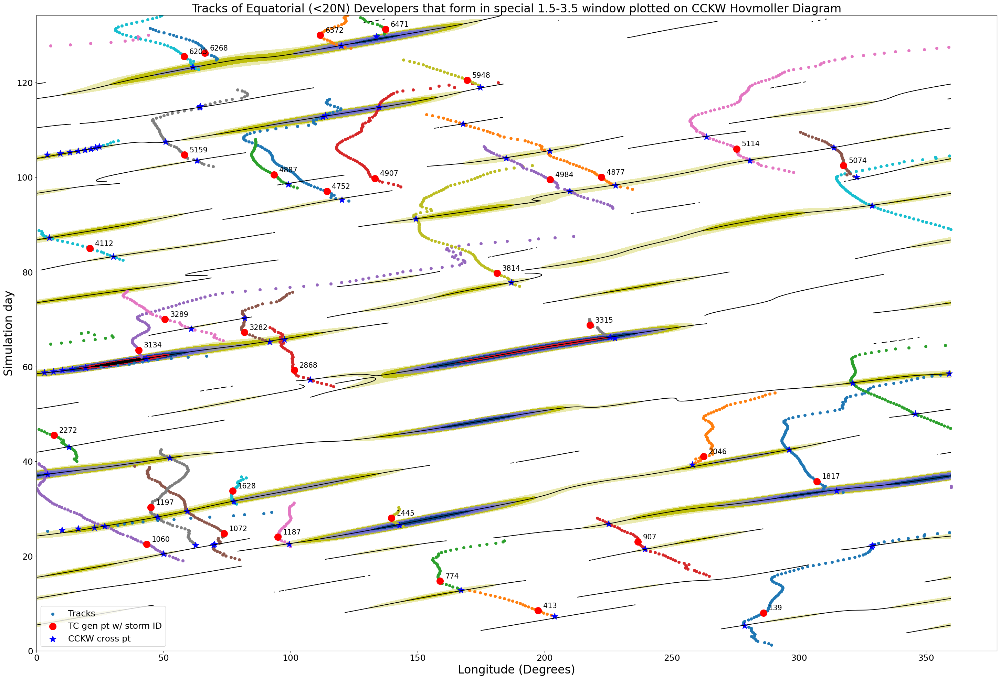

In [8]:
#Plot special-window developing waves on Hovmoller diagram 

plt.figure(figsize=(36,24))  # Adjust the figure size as needed

#Plot hovmoller diagram 
cs = plt.contour(X,Y,waveDatadt_pos,levels=[0],colors='k')
plt.contourf(X,Y, waveData, extend='both',cmap='gist_stern_r')
# plt.contour(X, Y, TDWaveData,levels=np.linspace(0.1,1.0,10), colors="k")

for ID, group in eq_dv_updated_groupbyID: 
    day = group["day_adj"]  # get all day information for one ndv ID
    lon= group["lon_TRACK"]  # get all longitude information for one ndv ID
    lat = group["lat_TRACK"]
        
    tcgen_row = group[group['tc_genesis'] == 1]
    cckw_cross_row = group[group['cckw_crest_cross'] == 1]

    #Plot each storm's track 
    plt.scatter(lon,day,linewidth=0.5)  # directly plot (lon, day)

    #Plot each storm's TC gen point
    plt.scatter(tcgen_row['lon_TRACK'],tcgen_row['day_adj'],color='r', marker='o', s=200)  # directly plot (lon, day)
    
    plt.text(tcgen_row['lon_TRACK']+2,tcgen_row['day_adj']+1,str(ID),fontsize=15, verticalalignment='center')

    

    #Plot each storm's CCKW crest intersection point (if there is one) 
    plt.scatter(cckw_cross_row['lon_TRACK'],cckw_cross_row['day_adj'],color='b', marker='*', s=200)  # directly plot (lon, day)
    
plt.xlabel('Longitude (Degrees)',fontsize=24) 
plt.ylabel('Simulation day',fontsize=24) 
plt.title('Tracks of Equatorial (<20N) Developers that form in special 1.5-3.5 window plotted on CCKW Hovmoller Diagram',fontsize=24) 
plt.xticks(fontsize=18)  # Increase font size of x-ticks
plt.yticks(fontsize=18)  # Increase font size of y-ticks
plt.legend(['Tracks','TC gen pt w/ storm ID','CCKW cross pt'],fontsize=18)

plt.savefig(f'{save_dir}/02_outputs/Equatorial_Devs_that_form_in_Rosi_Window_lessthan20N.png')


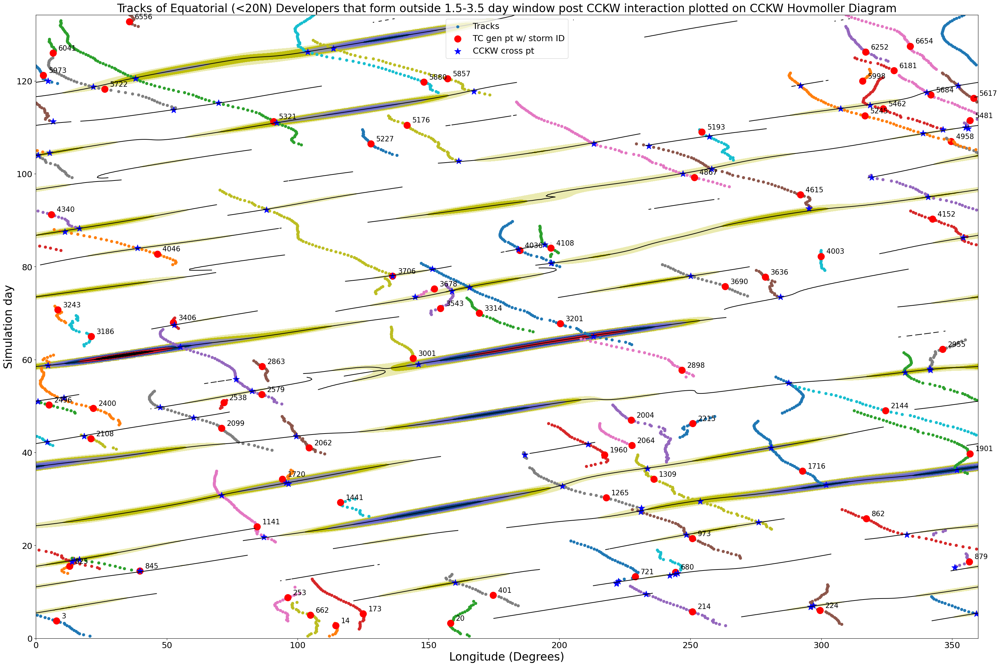

In [7]:
#Plot developing waves outside special window on Hovmoller diagram 

plt.figure(figsize=(36,24))  # Adjust the figure size as needed

#Plot hovmoller diagram 
cs = plt.contour(X,Y,waveDatadt_pos,levels=[0],colors='k')
plt.contourf(X,Y, waveData, extend='both',cmap='gist_stern_r')
# plt.contour(X, Y, TDWaveData,levels=np.linspace(0.1,1.0,10), colors="k")


# Plot each developer track 
eq_dv_outside_window_updated_groupbyID = eq_dv_outside_window_updated.groupby('ID')

for ID, group in eq_dv_outside_window_updated_groupbyID: 
    day = group["day_adj"]  # get all day information for one ndv ID
    lon = group["lon_TRACK"]  # get all longitude information for one ndv ID

    tcgen_row = group[group['tc_genesis'] == 1]
    cckw_cross_row = group[group['cckw_crest_cross'] == 1]

    #Plot each storm's track 
    plt.scatter(lon,day,linewidth=0.5)  # directly plot (lon, day)

    #Plot each storm's TC gen point
    plt.scatter(tcgen_row['lon_TRACK'],tcgen_row['day_adj'],color='r', marker='o', s=200)  # directly plot (lon, day)
    
    plt.text(tcgen_row['lon_TRACK']+2,tcgen_row['day_adj']+1,str(ID),fontsize=15, verticalalignment='center')

    

    #Plot each storm's CCKW crest intersection point (if there is one) 
    plt.scatter(cckw_cross_row['lon_TRACK'],cckw_cross_row['day_adj'],color='b', marker='*', s=200)  # directly plot (lon, day)
    
plt.xlabel('Longitude (Degrees)',fontsize=24) 
plt.ylabel('Simulation day',fontsize=24) 
plt.title('Tracks of Equatorial (<20N) Developers that form outside 1.5-3.5 day window post CCKW interaction plotted on CCKW Hovmoller Diagram',fontsize=24) 
plt.xticks(fontsize=18)  # Increase font size of x-ticks
plt.yticks(fontsize=18)  # Increase font size of y-ticks
plt.legend(['Tracks','TC gen pt w/ storm ID','CCKW cross pt'],fontsize=18)

plt.savefig(f'{save_dir}/02_outputs/Equatorial_Devs_that_form_outside_Rosi_window.png')


In [10]:
eq_ndv_updated

,ID,fhr,valid_time,lon_TRACK,lat_TRACK,vor850,day_adj,lon_track_hov_idx,day_track_hov_idx,cckw_crest_cross,suspect_point
0,5,96.0,2000-04-03 00:00:00,20.339893,19.761621,1.977540,4.50,203.0,18.0,0.0,0.0
1,5,102.0,2000-04-03 06:00:00,19.110119,19.418884,1.887530,4.75,191.0,19.0,0.0,0.0
2,5,108.0,2000-04-03 12:00:00,18.233143,19.023245,1.984146,5.00,182.0,20.0,0.0,0.0
3,5,114.0,2000-04-03 18:00:00,17.190731,18.471872,2.050785,5.25,172.0,21.0,0.0,0.0
4,5,120.0,2000-04-04 00:00:00,16.850864,18.265820,1.923036,5.50,169.0,22.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
7746,6701,2952.0,2000-07-31 00:00:00,279.824677,14.455955,1.475276,123.50,2798.0,494.0,0.0,0.0
7747,6701,2958.0,2000-07-31 06:00:00,280.385345,14.204089,1.080946,123.75,2804.0,495.0,0.0,0.0
7748,6701,2964.0,2000-07-31 12:00:00,280.754852,13.989798,0.966137,124.00,2808.0,496.0,0.0,0.0
7749,6701,2970.0,2000-07-31 18:00:00,280.298828,13.790131,0.974042,124.25,2803.0,497.0,0.0,0.0


In [11]:
#Non-developer analysis

#How many unique equatorial (<20N) nondevelopers total? 
total_ndv_cnt = eq_ndv_updated['ID'].nunique()

#How many of these ndv's have CCKW intersections? 
ndv_cckw_cross = eq_ndv_updated[eq_ndv_updated["cckw_crest_cross"] == 1]["ID"].unique()
ndv_cckw_cross_cnt = eq_ndv_updated[eq_ndv_updated["cckw_crest_cross"] == 1]["ID"].nunique()

#How many of these ndv's that have CCKW intersections also have big temporal gaps b/w pts?"
suspect_points = eq_ndv_updated[eq_ndv_updated["suspect_point"] == 1]["ID"].unique()


non_sus_IDs = np.setdiff1d(ndv_cckw_cross,suspect_points) #ID's of all the CCKW crossing nondevelopers with only non-suspect points. I might want to also do this for developers but no issues so far. 

#The code below finds out if the ndv still exists X days after crossing a CCKW with full data richness in between. If a storm has multiple crossings, it just needs to have one crossing that meets this criteria. This is done so
#that there is sufficient information for the ML approach. 

good_ndv_ID = [] 


#How many of these ndvs die out less than the allotted time/ don't have full data richness in that time?  

for ID in non_sus_IDs: 


    ID_data = eq_ndv_updated[eq_ndv_updated['ID'] == ID].reset_index(drop=True)

    cckw_cross_idx = np.where( ID_data['cckw_crest_cross'] == 1 )[0] #for a given storm ID, get all indices associated with crest crossing 

    num_cckw_cross_pts = len(cckw_cross_idx) 
    
    for i, idx in enumerate(cckw_cross_idx): # for a given storm ID, for each crest crossing 

        time_cross = ID_data['valid_time'].iloc[idx] #get the time at which the cross occurred 

        time_cross_plus_criteria = time_cross + pd.Timedelta(days=ndv_time_criteria) #time the storm needs to atleast exist for after crossing a CCKW crest. 

        #does the storm's dataset contain all times between the new time and the cckw cross time (including new time)? 
        datetime_vector = pd.date_range(start=time_cross, end=time_cross_plus_criteria, freq="6h") #assuming 6hr resolution (pretty standard) 

        all_time_pts_check = np.isin(datetime_vector, ID_data['valid_time']).all()

        if not all_time_pts_check: #if it doesn't contain full data richness then skip to next point
            
            continue

        #if it does, get index associated with that time 
        if all_time_pts_check:

            idx_new_time = np.where(ID_data['valid_time'] == time_cross_plus_criteria)[0][0]

            any_cckw_cross_in_time_chunk = np.any(ID_data['cckw_crest_cross'].iloc[idx+1:idx_new_time+1])

            if not any_cckw_cross_in_time_chunk: #we've met the criteria, we're gonna keep this non-developer.
                
                good_ndv_ID.append(ID)
                
                break 

            if any_cckw_cross_in_time_chunk: 
                
                continue

        
        
clean_ndv_cckw_cross_IDs = np.intersect1d(non_sus_IDs,good_ndv_ID) #ID's of all the CCKW crossing nondevelopers that have atleast one non-problematic, sufficiently rich cckw cross. 

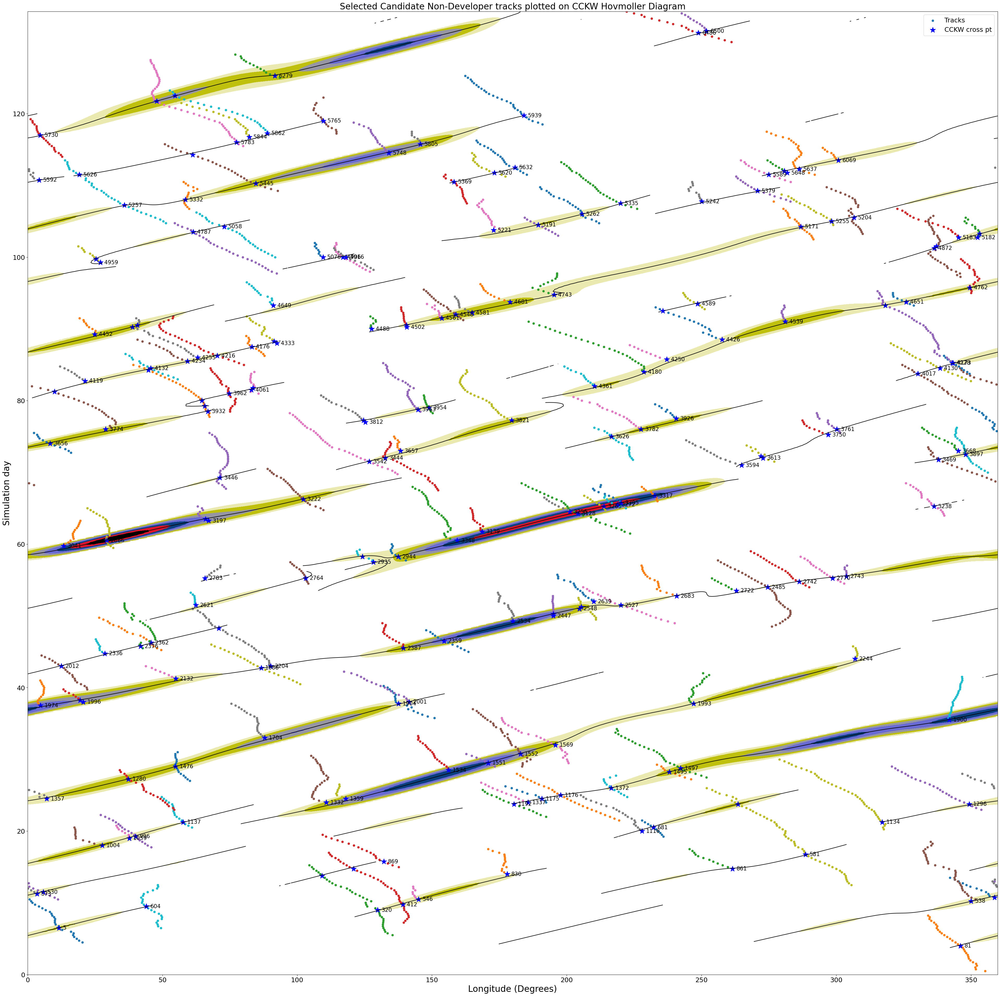

In [12]:
#Plot non-developing waves on Hovmoller diagram - only plot the IDs of storms I will use for ML. 
#These will be the non-developers I use for my ML analysis. 


plt.figure(figsize=(48,48))  # Adjust the figure size as needed

#Plot hovmoller diagram 
cs = plt.contour(X,Y,waveDatadt_pos,levels=[0],colors='k')
plt.contourf(X,Y, waveData, extend='both',cmap='gist_stern_r')
# plt.contour(X, Y, TDWaveData,levels=np.linspace(0.1,1.0,10), colors="k")


# Plot candidate nondeveloper tracks 

candidate_non_devs = eq_ndv_updated[eq_ndv_updated['ID'].isin(clean_ndv_cckw_cross_IDs)].copy()
candidate_non_devs_groupID = candidate_non_devs.groupby("ID")

i=0 
for ID, group in candidate_non_devs_groupID: 
    err_flag = False
    non_int_flag = False 
    
    day = group["day_adj"]  # get all day information for one ndv ID
    lon = group["lon_TRACK"]  # get all longitude information for one ndv ID
    cckw_cross_row = group[group['cckw_crest_cross'] == 1]

    
    #Plot each storm's track 
    plt.scatter(lon,day,linewidth=0.5)  # directly plot (lon, day)

    #Plot each storm's CCKW crest intersection point (if there is one) 
    plt.scatter(cckw_cross_row['lon_TRACK'],cckw_cross_row['day_adj'],color='b', marker='*', s=250)  # directly plot (lon, day)
    if not cckw_cross_row.empty:
        plt.text(cckw_cross_row['lon_TRACK'].iloc[0]+1.5,cckw_cross_row['day_adj'].iloc[0],str(int(ID)),fontsize=15, verticalalignment='center')
    i+=1
    
plt.xlabel('Longitude (Degrees)',fontsize=24) 
plt.ylabel('Simulation day',fontsize=24) 
plt.title('Selected Candidate Non-Developer tracks plotted on CCKW Hovmoller Diagram',fontsize=24) 
plt.xticks(fontsize=18)  # Increase font size of x-ticks
plt.yticks(fontsize=18)  # Increase font size of y-ticks
plt.legend(['Tracks','CCKW cross pt'],fontsize=18)

plt.savefig(f'{save_dir}/02_outputs/Equatorial_Nondevelopers.png')


In [13]:
#Combine all developers for the rest of this analysis because I am re-defining the criteria for the developers I want to use for my ML application, slightly different than Rosi's window so I'll likely have 
#samples from both categories. 

all_developers = pd.concat([eq_dv_updated, eq_dv_outside_window_updated], ignore_index=True, sort=False)

all_developers

,ID,fhr,valid_time,lon_TRACK,lat_TRACK,vor850,day_adj,tc_genesis,lon_track_hov_idx,day_track_hov_idx,cckw_crest_cross,suspect_point
0,139,18.0,2000-03-30 18:00:00,289.227661,12.518373,1.662696,1.25,0.0,2892.0,5.0,0.0,0.0
1,139,24.0,2000-03-31 00:00:00,288.096191,12.066323,1.480228,1.50,0.0,2881.0,6.0,0.0,0.0
2,139,30.0,2000-03-31 06:00:00,286.437073,11.456782,1.368978,1.75,0.0,2864.0,7.0,0.0,0.0
3,139,36.0,2000-03-31 12:00:00,283.840454,10.344266,1.408606,2.00,0.0,2838.0,8.0,0.0,0.0
4,139,42.0,2000-03-31 18:00:00,283.081482,10.036515,1.418872,2.25,0.0,2831.0,9.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4838,6654,3186.0,2000-08-09 18:00:00,314.067932,13.200831,3.058285,133.25,0.0,3141.0,533.0,0.0,0.0
4839,6654,3192.0,2000-08-10 00:00:00,312.773285,13.310003,2.932832,133.50,0.0,3128.0,534.0,0.0,0.0
4840,6654,3198.0,2000-08-10 06:00:00,311.564056,13.638085,2.771427,133.75,0.0,3116.0,535.0,0.0,0.0
4841,6654,3204.0,2000-08-10 12:00:00,310.353271,14.031085,2.564912,134.00,0.0,3104.0,536.0,0.0,0.0


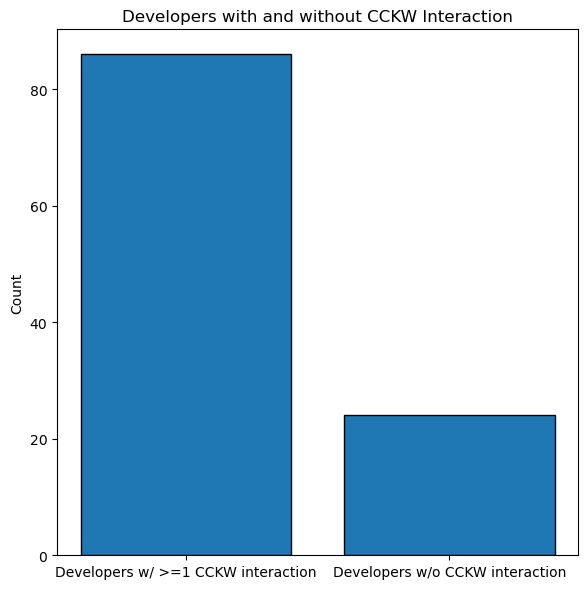

86 devs with >=1 cckw interaction
24 devs w/o cckw interaction


In [14]:
#For all developers -> how many do/don't interact with atleast one kelvin wave?

all_devs_groupID = all_developers.groupby("ID")  # Group all 110 developers by ID 

crest_cross_list = []
no_crest_cross_list = [] 

for ID, group in all_devs_groupID: 
    crest_cross = np.sum(group['cckw_crest_cross']) 
    if crest_cross > 0: 
        crest_cross_list.append(ID)
    else: 
        no_crest_cross_list.append(ID)


fig, ax = plt.subplots(figsize=(6, 6))   # width=10in, height=6in

counts = [len(crest_cross_list), len(no_crest_cross_list)]
labels = ['Developers w/ >=1 CCKW interaction', 'Developers w/o CCKW interaction']

ax.bar(labels, counts,edgecolor='black')
ax.set_ylabel('Count')
ax.set_title('Developers with and without CCKW Interaction')
fig.tight_layout()  # Adjust layout to prevent clipping of ylabel
plt.show()

print(f'{len(crest_cross_list)} devs with >=1 cckw interaction') 
print(f'{len(no_crest_cross_list)} devs w/o cckw interaction') 



In [15]:
#For all developers:
# If no CCKW crossing, return NaN's. 
# For the ones that have >=1 CCKW crossing find: 
# 1) The closest CCKW crossing in time to tc-genesis
# 2) time lag between tc genesis and closest cckw crossing 
# 3) time lag between wave formation (initial time pt) and cckw crossing. 


def closest_cckw_to_tcgen_and_rel_stats(eq_dv_updated_groupbyID): 

    #Initialize variables 
    cckw_tcgen_lag_time = np.full(len(eq_dv_updated_groupbyID), np.nan)
    cckw_tcgen_lag_ID = np.full(len(eq_dv_updated_groupbyID), np.nan)
    track_duration_before_closest_cckw_cross = np.full(len(eq_dv_updated_groupbyID), np.nan)
    
    i=0

    #for each developer: 
    
    for ID, group in eq_dv_updated_groupbyID:

        #find days, cckw crest cross(es) and tc_genesis 
        days = group['day_adj']
        cckw_crest_cross = group['cckw_crest_cross']
        tc_genesis = group['tc_genesis']

        #find genesis index 
        idx_tc_genesis = tc_genesis[tc_genesis == 1].index

        #get day associated with genesis 
        genesis_time_tcgen = days[idx_tc_genesis]

        #find closest cckw crossing in time to the tc genesis point 

        #first find the time(s) associated with all the cckw crossing times 
        idxs_crest_cross = cckw_crest_cross[cckw_crest_cross == 1].index

        #if there are no crest crosses, let's skip this developer. 
        if idxs_crest_cross.size == 0:

            i+=1
            continue
        

        #get associated times of crest cross(es) 
        crest_cross_times = days[idxs_crest_cross]

        #find closest crest cross in time - this is the crest "associated" with tc genesis for purposes of our analysis. 

        #find times between tcgenesis and all of the CCKW crest crosses
        dt_abs = abs( crest_cross_times - genesis_time_tcgen.item() )

        #index of closest cckw to tc genesis (considering only absolute value so this crest could be either before or after tcgen!) 
        idx_min_dt = dt_abs.idxmin()
        
        dt = genesis_time_tcgen.item() - crest_cross_times

        #For this developer, what is the time lag between intersection with closest CCKW and tc genesis?
        closest_crest_cross_dt_from_tcgen = dt[idx_min_dt]

        
        #How long does the storm exist for before it interacts with its closest CCKW to tc genesis? 
    
        #This is def useful for developers that form after crossing a cckw, not sure about other cases. 
        #FOR NOW: I will only record data for cases where the storm developers after a CCKW cross. 
        
        if closest_crest_cross_dt_from_tcgen >= 0: 
            time_between_cckw_cross_and_storm_start =  crest_cross_times[idx_min_dt] - days.iloc[0]
            
            track_duration_before_closest_cckw_cross[i] = time_between_cckw_cross_and_storm_start

        
            
        cckw_tcgen_lag_time[i]= closest_crest_cross_dt_from_tcgen
        
        cckw_tcgen_lag_ID[i] = ID

        i+=1

    dev_cckw_tcgen_summary_df = pd.DataFrame({
    "ID": cckw_tcgen_lag_ID,
    "LagTime": cckw_tcgen_lag_time,
    "TrackDurationBeforeClosestCCKW": track_duration_before_closest_cckw_cross
    })
        
    return cckw_tcgen_lag_time, cckw_tcgen_lag_ID, track_duration_before_closest_cckw_cross, dev_cckw_tcgen_summary_df

cckw_tcgen_lag_time, cckw_tcgen_lag_ID, track_duration_before_closest_cckw_cross, dev_cckw_tcgen_summary_df = closest_cckw_to_tcgen_and_rel_stats(all_devs_groupID)


Text(0.5, 1.0, 'Developer count before/after CCKW interaction')

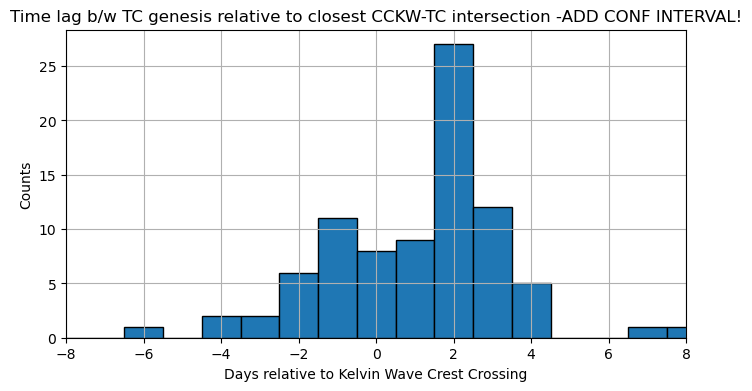

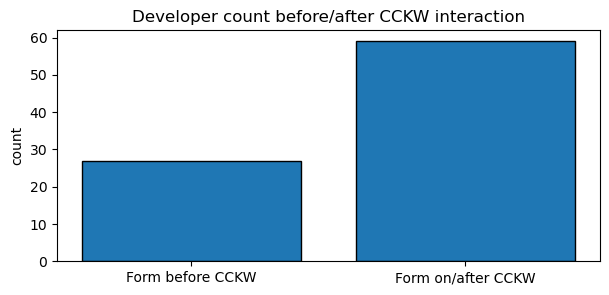

In [16]:
#For the storms that cross >=1 CCKW's plot the time lag between the storm tc-genesis time and the storm intersecting the closest cckw 

fig,ax = plt.subplots(figsize = (8,4)) 

bins = np.arange(-8.5, 9.5, 1)  # bins centered on each integer day

counts, bin_edges, patches = ax.hist(cckw_tcgen_lag_time, bins=bins,edgecolor='black')

ax.set_xlim([-8,8])
ax.grid()
ax.set_xlabel('Days relative to Kelvin Wave Crest Crossing')
ax.set_ylabel('Counts') 
ax.set_title('Time lag b/w TC genesis relative to closest CCKW-TC intersection -ADD CONF INTERVAL!')

fig2,ax2 = plt.subplots(figsize = (7,3)) 

neg_lag = len([x for x in cckw_tcgen_lag_time if x < 0])
pos_lag = len([x for x in cckw_tcgen_lag_time if x >= 0])

all_lags = [neg_lag, pos_lag]
labels = ['Form before CCKW','Form on/after CCKW']
ax2.bar(labels, all_lags,edgecolor='black')
ax2.set_ylabel('count') 
ax2.set_title('Developer count before/after CCKW interaction')

46 developers meet my criteria out of 110 total developers


/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posx = float(self.convert_xunits(x))
/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:763: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posy = float(self.convert_yunits(y))
/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:905: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  x = float(self.convert_xunits(self._x))
/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:906: FutureWarning: Calling float on a single el

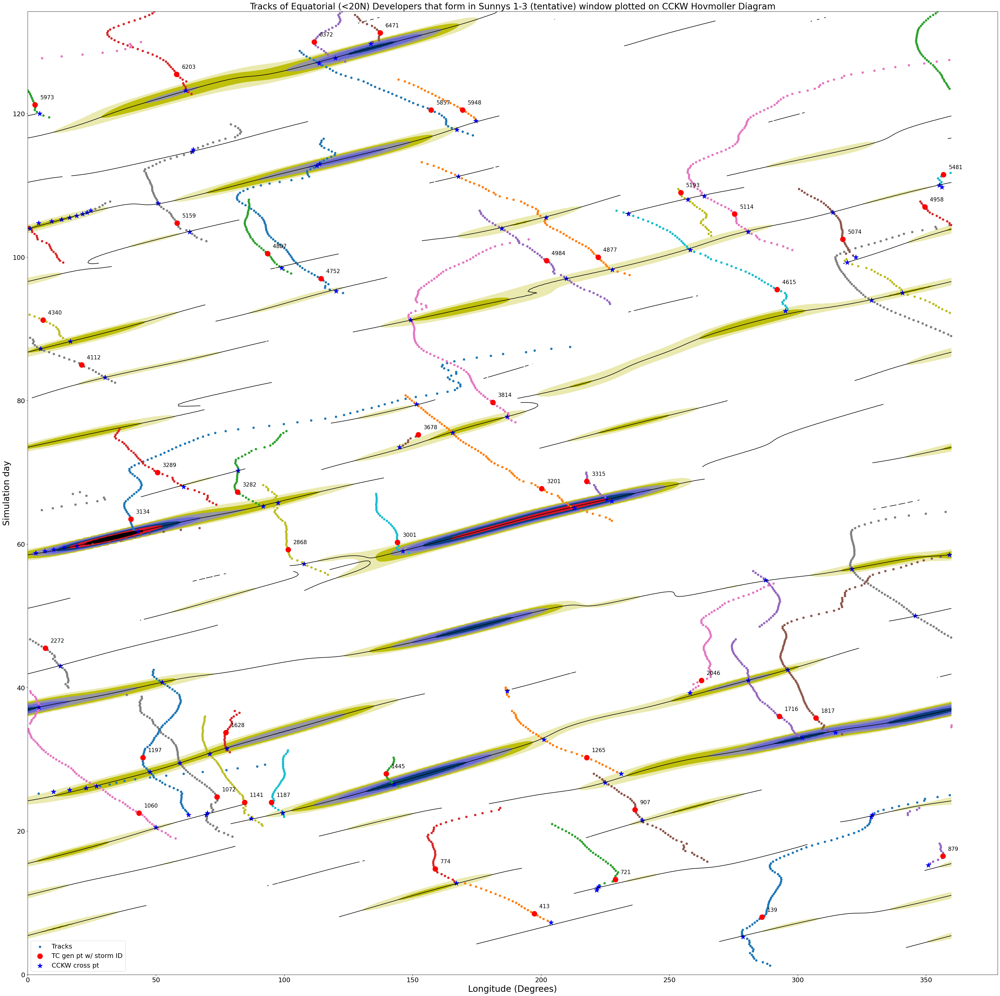

In [17]:
# We have so far focused on ALL developers that have >=1 CCKW crossings. 
# Now find stats on the storms that have a 1-3 day positive lag between tc-genesis and closest CCKW crest crossing 
# This will be my critieria for my new set of developers i will use in my ML analysis (previously was using the 33 provided by rosi).


#First, let's calculate some stats and then plot my developers. 


plt.figure(figsize=(48,48))  # Adjust the figure size as needed

cs = plt.contour(X,Y,waveDatadt_pos,levels=[0],colors='k')
plt.contourf(X,Y, waveData, extend='both',cmap='gist_stern_r')


#indices of storms in my window 
how_many_in_1_to_3_day_window_indices = np.where( (cckw_tcgen_lag_time>=1) & (cckw_tcgen_lag_time<=3) )

#get associated storm ID's of storms in this window 
cckw_tcgen_lag_ID_1_3_day_window = cckw_tcgen_lag_ID[how_many_in_1_to_3_day_window_indices]

#How many storms 
print(f'{len(cckw_tcgen_lag_ID_1_3_day_window)} developers meet my criteria out of {len(cckw_tcgen_lag_ID)} total developers')

#Truncate all developer dataset to just include the storms we care about that meet this criteria 
all_developers_1_3_day_window = all_developers [ all_developers['ID'].isin(cckw_tcgen_lag_ID_1_3_day_window) ] 

all_developers_1_3_day_window_groupbyID = all_developers_1_3_day_window.groupby('ID')

#PLOT! 
for ID, group in all_developers_1_3_day_window_groupbyID: 
    
    day = group["day_adj"]  # get all day information for one ndv ID
    lon = group["lon_TRACK"]  # get all longitude information for one ndv ID

    tcgen_row = group[group['tc_genesis'] == 1]
    cckw_cross_row = group[group['cckw_crest_cross'] == 1]

    #Plot each storm's track 
    plt.scatter(lon,day,linewidth=0.5)  # directly plot (lon, day)

    #Plot each storm's TC gen point
    plt.scatter(tcgen_row['lon_TRACK'],tcgen_row['day_adj'],color='r', marker='o', s=200)  # directly plot (lon, day)
    
    plt.text(tcgen_row['lon_TRACK']+2,tcgen_row['day_adj']+1,str(ID),fontsize=15, verticalalignment='center')

    #Plot each storm's CCKW crest intersection point (if there is one) 
    plt.scatter(cckw_cross_row['lon_TRACK'],cckw_cross_row['day_adj'],color='b', marker='*', s=200)  # directly plot (lon, day)
    
plt.xlabel('Longitude (Degrees)',fontsize=24) 
plt.ylabel('Simulation day',fontsize=24) 
plt.title('Tracks of Equatorial (<20N) Developers that form in Sunnys 1-3 (tentative) window plotted on CCKW Hovmoller Diagram' , fontsize=24) 
plt.xticks(fontsize=18)  # Increase font size of x-ticks
plt.yticks(fontsize=18)  # Increase font size of y-ticks
plt.legend(['Tracks','TC gen pt w/ storm ID','CCKW cross pt'],fontsize=18)

plt.savefig(f'{save_dir}/02_outputs/Equatorial_Devs_that_form_in_1_to_3_day_Sunny_window.png')


In [18]:
#summary stats table for the developers that meet this new criteria 

dev_cckw_tcgen_summary_1_to_3_day_window = dev_cckw_tcgen_summary_df.query("LagTime>=1 and LagTime <=3")
dev_cckw_tcgen_summary_1_to_3_day_window

#Let's save this lag time off 
dev_cckw_tcgen_summary_1_to_3_day_window.to_csv(f'{save_dir}/02_outputs/developer_lag_times.csv')


Text(0, 0.5, 'count')

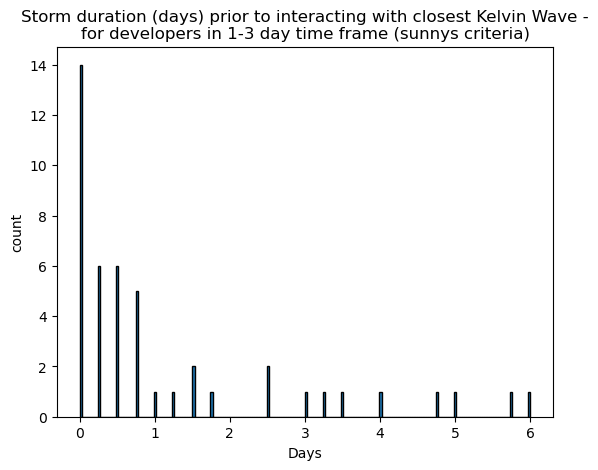

In [19]:
#For my 1-3 day window, how long do the storms exist for prior to intersecting their first kelvin wave?

counts, bin_edges, patches = plt.hist(dev_cckw_tcgen_summary_1_to_3_day_window['TrackDurationBeforeClosestCCKW'],bins=200,edgecolor='black')
plt.title(
    'Storm duration (days) prior to interacting with closest Kelvin Wave -\n'
    'for developers in 1-3 day time frame (sunnys criteria)')

plt.xlabel('Days')
plt.ylabel('count')


In [20]:
#Let's save off an updated csv with the developers and non-developers timeseries that we will use for ML 

#Saving off the developers and nondevelopers that meet my criteria 


candidate_devs = all_developers[all_developers['ID'].isin(cckw_tcgen_lag_ID_1_3_day_window)].copy()
candidate_non_devs = eq_ndv_updated[eq_ndv_updated['ID'].isin(clean_ndv_cckw_cross_IDs)].copy()


In [21]:
#Sanity check on numbers

num_devs = candidate_devs['ID'].nunique()
num_non_devs = candidate_non_devs['ID'].nunique()
num_non_devs_total_cckw_interactions = np.sum(candidate_non_devs['cckw_crest_cross']==1)
print(num_devs)
print(num_non_devs)
print(num_non_devs_total_cckw_interactions)

46
175
205


In [22]:
#Merge both ndv/dv datasets

#For the ndv's -> we will be only including storms that have zero suspect points as well as have cckw intersections. 
#I do not remove developers based on suspect points because I did an inspection of all 46 storms and the suspect pts do not seem to cause issues. 
#(SUNNY: YOU MAY WANT TO REVISIT THIS LATER). 

#first add column of zeros for tc-genesis to the non-developers df to make it line up with columns of developers 
candidate_non_devs.loc[:,'tc_genesis'] = 0

#also add new column indicating whether a storm is a developer or non-developer, we'll use this later 
candidate_non_devs.loc[:,'developer'] = 0

#also add new column indicating whether a storm is a developer or non-developer, we'll use this later 
candidate_devs.loc[:,'developer'] = 1




In [23]:
selected_eq_dv_ndv_for_ML = pd.concat([candidate_devs, candidate_non_devs], ignore_index=True)


In [24]:
#Before we save off the dataset let's change the valid_time column from string to datetime 

selected_eq_dv_ndv_for_ML['valid_time'] = pd.to_datetime(selected_eq_dv_ndv_for_ML['valid_time'],format="%Y-%m-%d %H:%M:%S")


In [28]:
selected_eq_dv_ndv_for_ML

,ID,fhr,valid_time,lon_TRACK,lat_TRACK,vor850,day_adj,tc_genesis,lon_track_hov_idx,day_track_hov_idx,cckw_crest_cross,suspect_point,developer
0,139,18.0,2000-03-30 18:00:00,289.227661,12.518373,1.662696,1.25,0.0,2892.0,5.0,0.0,0.0,1
1,139,24.0,2000-03-31 00:00:00,288.096191,12.066323,1.480228,1.50,0.0,2881.0,6.0,0.0,0.0,1
2,139,30.0,2000-03-31 06:00:00,286.437073,11.456782,1.368978,1.75,0.0,2864.0,7.0,0.0,0.0,1
3,139,36.0,2000-03-31 12:00:00,283.840454,10.344266,1.408606,2.00,0.0,2838.0,8.0,0.0,0.0,1
4,139,42.0,2000-03-31 18:00:00,283.081482,10.036515,1.418872,2.25,0.0,2831.0,9.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5718,6500,3180.0,2000-08-09 12:00:00,247.098923,15.032833,1.987223,133.00,0.0,2471.0,532.0,0.0,0.0,0
5719,6500,3186.0,2000-08-09 18:00:00,245.891373,14.602074,1.811549,133.25,0.0,2459.0,533.0,0.0,0.0,0
5720,6500,3192.0,2000-08-10 00:00:00,245.026688,14.015660,1.715568,133.50,0.0,2450.0,534.0,0.0,0.0,0
5721,6500,3198.0,2000-08-10 06:00:00,243.863815,13.362695,1.530688,133.75,0.0,2439.0,535.0,0.0,0.0,0


In [30]:
Kelvin_2D_ds

<xarray.Dataset> Size: 2GB
Dimensions:     (time: 538, lon: 3600, lat: 255)
Coordinates:
  * time        (time) datetime64[ns] 4kB 2000-03-29T12:00:00 ... 2000-08-10T...
  * lon         (lon) float64 29kB 0.0 0.1 0.2 0.3 ... 359.6 359.7 359.8 359.9
  * lat         (lat) float64 2kB -4.95 -4.85 -4.75 -4.65 ... 20.25 20.35 20.45
Data variables:
    filteredpr  (time, lat, lon) float32 2GB ...

In [34]:
#NEW: Let's also now add a column with information on Kelvin Wave strength at each point. 

for i, row in selected_eq_dv_ndv_for_ML.iterrows():
    time = row['valid_time']
    lon = row['lon_TRACK']
    lat = row['lat_TRACK']
    kelvin_val = Kelvin_2D_ds['filteredpr'].sel(time=time,lon=lon,lat=lat,method='nearest').item()
    selected_eq_dv_ndv_for_ML.loc[i, 'cckw_filteredpr_val'] = kelvin_val


In [49]:
#Save dataset 
selected_eq_dv_ndv_for_ML.to_csv(f'{save_dir}/02_outputs/selected_eq_dv_ndv_timeseries.csv',index=False)

/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posx = float(self.convert_xunits(x))
/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:763: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posy = float(self.convert_yunits(y))
/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:905: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  x = float(self.convert_xunits(self._x))
/glade/u/home/sjsharma/.conda/envs/my_pangeo_env/lib/python3.11/site-packages/matplotlib/text.py:906: FutureWarning: Calling float on a single el

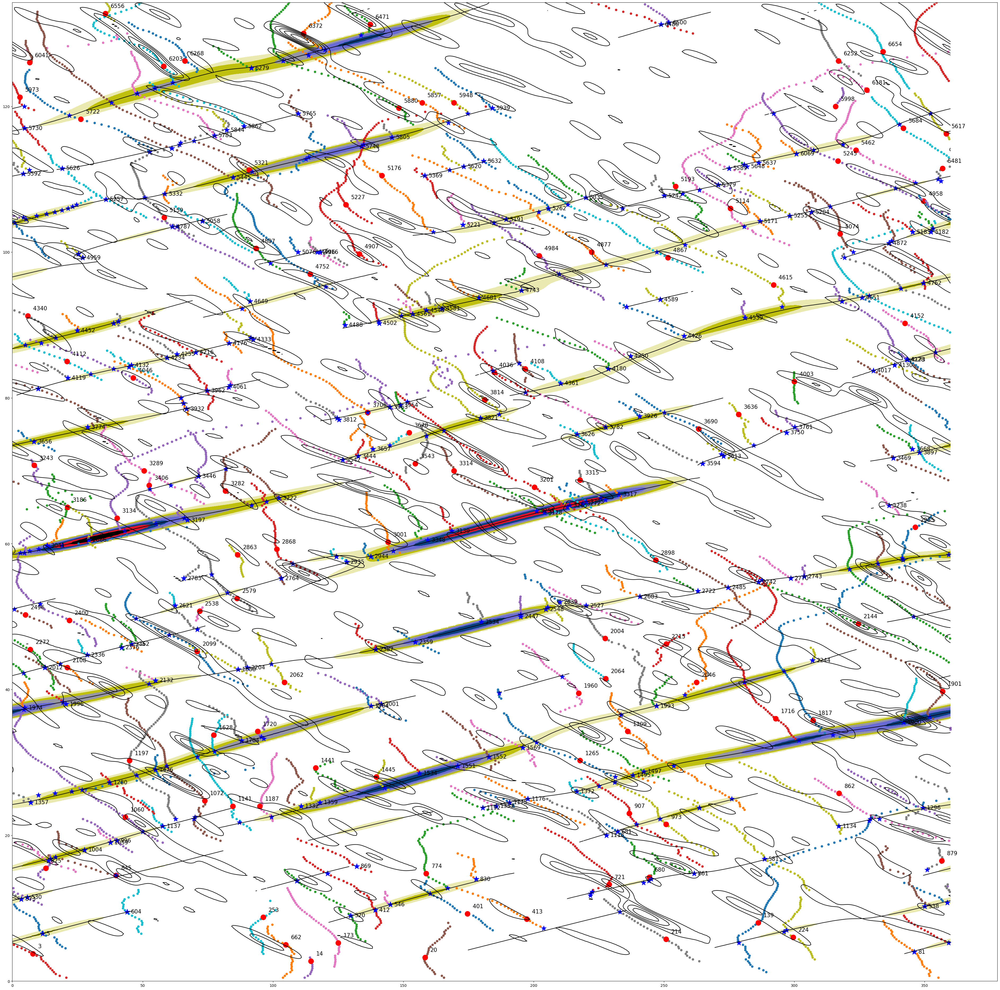

In [24]:
### PLOT BELOW IS JUST FOR FUN ### Quick plot of (most) nondevelopers, developer tracks on top of identified TD's (as found from Kiladis filter) 


# plt.figure(figsize=(48,48))  # Adjust the figure size as needed

# cs = plt.contour(X,Y,waveDatadt_pos,levels=[0],colors='k')
# plt.contourf(X,Y, waveData, extend='both',cmap='gist_stern_r')
# plt.contour(X, Y, TDWaveData,levels=np.linspace(0.1,1.0,10), colors="k")


# for ID, group in eq_dv_updated_groupbyID: 
#     day = group["day_adj"]  # get all day information for one ndv ID
#     lon = group["lon_TRACK"]  # get all longitude information for one ndv ID

#     tcgen_row = group[group['tc_genesis'] == 1]
#     cckw_cross_row = group[group['cckw_crest_cross'] == 1]

#     #Plot each storm's track 
#     plt.scatter(lon,day,linewidth=0.5)  # directly plot (lon, day)

#     #Plot each storm's TC gen point
#     plt.scatter(tcgen_row['lon_TRACK'],tcgen_row['day_adj'],color='r', marker='o', s=200)  # directly plot (lon, day)
    
#     plt.text(tcgen_row['lon_TRACK']+2,tcgen_row['day_adj']+1,str(ID),fontsize=15, verticalalignment='center')

    

#     #Plot each storm's CCKW crest intersection point (if there is one) 
#     plt.scatter(cckw_cross_row['lon_TRACK'],cckw_cross_row['day_adj'],color='b', marker='*', s=200)  # directly plot (lon, day)

# for ID, group in eq_dv_outside_window_updated_groupbyID: 
#     day = group["day_adj"]  # get all day information for one ndv ID
#     lon = group["lon_TRACK"]  # get all longitude information for one ndv ID

#     tcgen_row = group[group['tc_genesis'] == 1]
#     cckw_cross_row = group[group['cckw_crest_cross'] == 1]

#     #Plot each storm's track 
#     plt.scatter(lon,day,linewidth=0.5)  # directly plot (lon, day)

#     #Plot each storm's TC gen point
#     plt.scatter(tcgen_row['lon_TRACK'],tcgen_row['day_adj'],color='r', marker='o', s=200)  # directly plot (lon, day)
    
#     plt.text(tcgen_row['lon_TRACK']+2,tcgen_row['day_adj']+1,str(ID),fontsize=15, verticalalignment='center')

    

#     #Plot each storm's CCKW crest intersection point (if there is one) 
#     plt.scatter(cckw_cross_row['lon_TRACK'],cckw_cross_row['day_adj'],color='b', marker='*', s=200)  # directly plot (lon, day)

# for ID, group in candidate_non_devs_groupID: 
#     err_flag = False
#     non_int_flag = False 
    
#     day = group["day_adj"]  # get all day information for one ndv ID
#     lon = group["lon_TRACK"]  # get all longitude information for one ndv ID
#     cckw_cross_row = group[group['cckw_crest_cross'] == 1]

    
#     #Plot each storm's track 
#     plt.scatter(lon,day,linewidth=0.5)  # directly plot (lon, day)

#     #Plot each storm's CCKW crest intersection point (if there is one) 
#     plt.scatter(cckw_cross_row['lon_TRACK'],cckw_cross_row['day_adj'],color='b', marker='*', s=250)  # directly plot (lon, day)
#     if not cckw_cross_row.empty:
#         plt.text(cckw_cross_row['lon_TRACK'].iloc[0]+1.5,cckw_cross_row['day_adj'].iloc[0],str(int(ID)),fontsize=15, verticalalignment='center')
#     i+=1